In [1]:
#importing libraries
import os
import cv2
import numpy as np
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
from plotly.offline import init_notebook_mode
init_notebook_mode(connected=True)
from PIL import Image
from sklearn.model_selection import train_test_split,KFold
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report,roc_auc_score,roc_curve
from sklearn.metrics import f1_score,precision_score,recall_score
from keras.models import load_model
from keras.models import Sequential
from keras.layers import Dense,Dropout,Flatten,Conv2D,MaxPooling2D,BatchNormalization,Activation
from keras.utils import to_categorical
from keras.optimizers import Adam, RMSprop
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ModelCheckpoint,ReduceLROnPlateau,EarlyStopping
from tensorflow.keras.regularizers import l1, l2, l1_l2
from scikeras.wrappers import KerasClassifier, KerasRegressor
import warnings
warnings.filterwarnings("ignore")
warnings.simplefilter(action='ignore', category=FutureWarning)
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.options.display.float_format = '{:.2f}'.format
pd.options.mode.chained_assignment = None

In [187]:
# loading datasets:

csv_data=pd.read_csv('train_labels.csv')
df=csv_data.copy()
df.head()

,id,label
0,f38a6374c348f90b587e046aac6079959adf3835,0
1,c18f2d887b7ae4f6742ee445113fa1aef383ed77,1
2,755db6279dae599ebb4d39a9123cce439965282d,0
3,bc3f0c64fb968ff4a8bd33af6971ecae77c75e08,0
4,068aba587a4950175d04c680d38943fd488d6a9d,0


In [188]:
# hedef değişkenin dağılımı 
csv_data['label'].value_counts()

label
0    130908
1     89117
Name: count, dtype: int64

In [189]:
# hedef değişkenin dağılımını pie chart ile görselleştirme

# 0 'ları kansersiz , 1'leri kanserli olarak tanımlıyoruz.
df['label'] = df['label'].replace({0:'normal', 1:'Kanserli'})

fig = px.pie(df, names='label', title='Hedef Değişkenin Dağılımı',
             template='plotly_dark', hole=0.5,width=600, height=400)

fig.update_traces(textinfo='percent', pull=[0, 0.05], rotation=90,
                    marker=dict(colors=['#FF6347', '#1E90FF'], line=dict(color='#000000', width=2)))


fig.show()

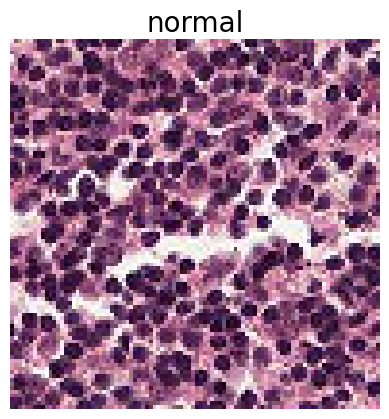

In [190]:
# train veri setinden bir örnek gözlem

exam_path='train/'

img=Image.open(exam_path + os.listdir(exam_path)[5])
plt.imshow(img)
plt.axis('off')
label=df.loc[df['id']==os.listdir(exam_path)[5].split('.')[0],'label'].values[0]
plt.title(label, fontsize=20)
plt.show()

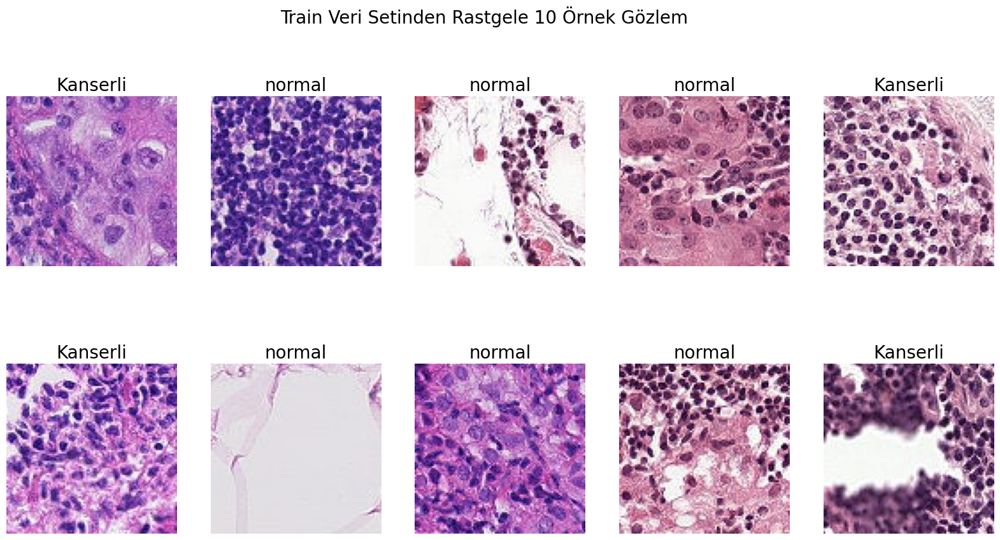

In [191]:
# train veri setinden rastgele 10 örnek gözlem

fig, axarr = plt.subplots(2,5, figsize=(20,10))
fig.suptitle('Train Veri Setinden Rastgele 10 Örnek Gözlem', fontsize=20)
for i in range(2):
    for j in range(5):
        img=Image.open(exam_path + os.listdir(exam_path)[np.random.randint(0,len(os.listdir(exam_path)))])
        axarr[i,j].imshow(img)
        label=df.loc[df['id']==os.listdir(exam_path)[j].split('.')[0],'label'].values[0]
        axarr[i,j].set_title(label, fontsize=20)
        axarr[i,j].axis('off')
plt.show()

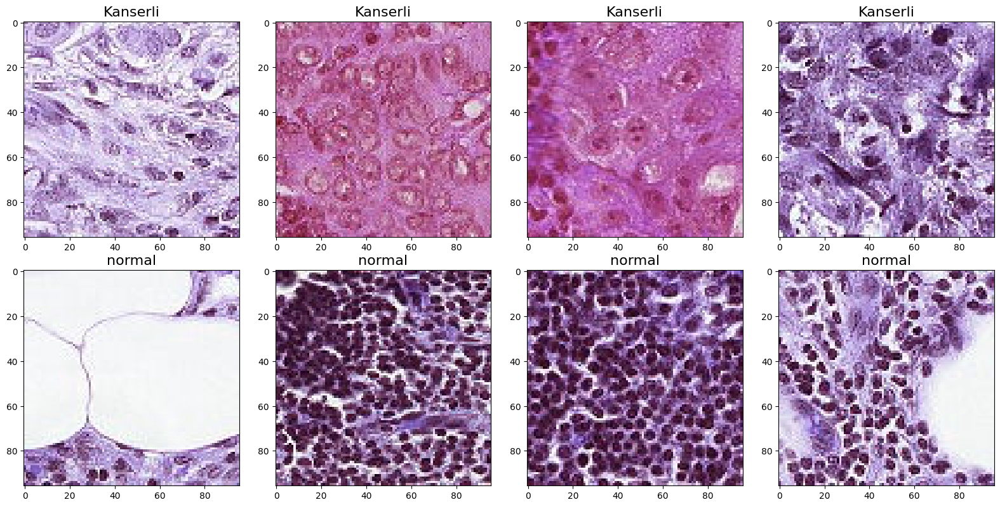

In [192]:
def draw_category_images(col_name,figure_cols, df, IMAGE_PATH):
    
    """
    bu fonksiyon verilen kategorik değişkenin her bir kategorisinden rastgele seçilen 
    gözlemleri görselleştirir.
    """
    

    categories = (df.groupby([col_name])[col_name].nunique()).index
    f, ax = plt.subplots(nrows=len(categories),ncols=figure_cols, 
                         figsize=(4*figure_cols,4*len(categories))) # adjust size here
    # draw a number of images for each location
    for i, cat in enumerate(categories):
        sample = df[df[col_name]==cat].sample(figure_cols) # figure_cols is also the sample size
        for j in range(0,figure_cols):
            file=IMAGE_PATH + sample.iloc[j]['id'] + '.tif'
            im=cv2.imread(file)
            ax[i, j].imshow(im, resample=True, cmap='gray')
            ax[i, j].set_title(cat, fontsize=16)  
    plt.tight_layout()
    plt.show()
    
draw_category_images('label',4, df, exam_path)


In [195]:
# train verisetinden 25 bin kanserli, 25 bin kansersiz gözlem alacağız
imgs=25000

# take a random sample of class 0 with size equal to num samples in class 1
df_kansersiz = csv_data[csv_data['label'] == 0].sample(imgs, random_state = 42)
# filter out class 1
df_kanserli = csv_data[csv_data['label'] == 1].sample(imgs, random_state = 42)

In [197]:
from sklearn.utils import shuffle

# concat the dataframes
df_data = pd.concat([df_kansersiz, df_kanserli], axis=0).reset_index(drop=True)
# shuffle
df_data = shuffle(df_data)

df_data['label'].value_counts()

label
0    25000
1    25000
Name: count, dtype: int64

In [198]:
# train_test_split
from sklearn.model_selection import train_test_split

# stratify=y creates a balanced validation set.
y = df_data['label']

df_train, df_val = train_test_split(df_data, test_size=0.25, random_state=42, stratify=y)

print(df_train.shape)
print(df_val.shape)

(37500, 2)
(12500, 2)


In [199]:
print(df_train['label'].value_counts())
print("\n")
print(df_val['label'].value_counts())

label
0    18750
1    18750
Name: count, dtype: int64


label
0    6250
1    6250
Name: count, dtype: int64


In [200]:
if os.path.exists('base_dir'):
    pass
else:

    # Create a new directory
    base_dir = 'base_dir'
    os.mkdir(base_dir)

    #[CREATE FOLDERS INSIDE THE BASE DIRECTORY]
    # train_dir
    train_dir = os.path.join(base_dir, 'train_dir')
    os.mkdir(train_dir)

    # val_dir
    val_dir = os.path.join(base_dir, 'val_dir')
    os.mkdir(val_dir)

    # [CREATE FOLDERS INSIDE THE TRAIN AND VALIDATION FOLDERS]
    # Inside each folder we create separate folders for each class

    # create new folders inside train_dir
    normal = os.path.join(train_dir, 'normal')
    os.mkdir(normal)
    kanserli = os.path.join(train_dir, 'kanserli')
    os.mkdir(kanserli)

    # create new folders inside val_dir
    normal = os.path.join(val_dir, 'normal')
    os.mkdir(normal)
    kanserli = os.path.join(val_dir, 'kanserli')
    os.mkdir(kanserli)

In [201]:
# Set the id as the index in df_data
df_data.set_index('id', inplace=True)

In [202]:
import shutil

if os.path.exists('base_dir'):
    pass
else:

    # Transfer the train images

    # Get a list of train and val images
    train_list = list(df_train['id'])
    val_list = list(df_val['id'])

    # Transfer the train images
    for image in train_list:
        # the id in the csv file does not have the .tif extension therefore we add it here
        fname = image + '.tif'
        # get the label for a certain image
        target = df_data.loc[image,'label']

        # these must match the folder names
        if target == 0:
            label = 'normal'
        if target == 1:
            label = 'kanserli'

        # source path to image
        src = os.path.join('train/', fname)
        # destination path to image
        dst = os.path.join(train_dir, label, fname)
        # copy the image from the source to the destination
        shutil.copyfile(src, dst)


    # Transfer the val images
    for image in val_list:
        # the id in the csv file does not have the .tif extension therefore we add it here
        fname = image + '.tif'
        # get the label for a certain image
        target = df_data.loc[image,'label']

        # these must match the folder names
        if target == 0:
            label = 'normal'
        if target == 1:
            label = 'kanserli'

        # source path to image
        src = os.path.join('train/', fname)
        # destination path to image
        dst = os.path.join(val_dir, label, fname)
        # copy the image from the source to the destination
        shutil.copyfile(src, dst)

In [203]:
# her bir klasörde kaç tane eğitim resmi olduğunu kontrol edin
print(len(os.listdir('base_dir/train_dir/normal')))
print(len(os.listdir('base_dir/train_dir/kanserli')))
print(len(os.listdir('base_dir/val_dir/normal')))
print(len(os.listdir('base_dir/val_dir/kanserli')))

18750
18750
6250
6250


In [204]:
# data augmentation 

datagen=ImageDataGenerator(rescale=1./255,
                            rotation_range=15,
                            zoom_range = 0.2,
                            width_shift_range=0.1,
                            height_shift_range=0.2,
                            horizontal_flip=True,
                            vertical_flip=True) 


train_aug=datagen.flow_from_directory('base_dir/train_dir',
                                        target_size=(96,96),
                                        batch_size=32,
                                        class_mode='binary',
                                        shuffle=True)

val_aug=datagen.flow_from_directory('base_dir/val_dir',
                                        target_size=(96,96),
                                        batch_size=32,
                                        class_mode='binary',
                                        shuffle=True)

val_aug1=datagen.flow_from_directory('base_dir/val_dir',
                                        target_size=(96,96),
                                        batch_size=32,
                                        class_mode='binary',
                                        shuffle=False)

Found 37500 images belonging to 2 classes.
Found 12500 images belonging to 2 classes.
Found 12500 images belonging to 2 classes.


In [205]:
# creating a model

model=Sequential()

kernel_boyutu=(3,3)

model.add(Conv2D(32, kernel_boyutu, activation='relu',padding='same', input_shape=(96,96,3)))
model.add(Conv2D(32, kernel_boyutu, activation='relu',padding='same'))
model.add(MaxPooling2D(2,2))
model.add(BatchNormalization())

model.add(Conv2D(64, kernel_boyutu, activation='relu',padding='same'))
model.add(Conv2D(64, kernel_boyutu, activation='relu',padding='same'))
model.add(MaxPooling2D(2,2))
model.add(BatchNormalization())

model.add(Conv2D(128, kernel_boyutu, activation='relu',padding='same'))
model.add(Conv2D(128, kernel_boyutu, activation='relu',padding='same' ))
model.add(MaxPooling2D(2,2))
model.add(BatchNormalization())

model.add(Conv2D(256, kernel_boyutu, activation='relu',padding='same'))
model.add(Conv2D(256, kernel_boyutu, activation='relu',padding='same' ))
model.add(MaxPooling2D(2,2))
model.add(BatchNormalization())

model.add(Conv2D(128, kernel_boyutu, activation='relu',padding='same'))
model.add(MaxPooling2D(2,2))
model.add(Conv2D(128, kernel_boyutu, activation='relu',padding='same' ))
model.add(MaxPooling2D(2,2))
model.add(BatchNormalization())

model.add(Flatten())

model.add(Dense(256, activation='relu', kernel_regularizer=l2(0.001)))
model.add(Dropout(0.3))
model.add(Dense(128, activation='relu', kernel_regularizer=l2(0.001)))
model.add(Dropout(0.3))

model.add(Dense(1, activation='sigmoid'))

# optimizer
adam_op=Adam(learning_rate=0.0001, beta_1=0.9, beta_2=0.999, epsilon=1e-07, amsgrad=False) 

# modeli derleme:
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [207]:
model.summary()

Model: "sequential_10"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_81 (Conv2D)              │ (None, 96, 96, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_82 (Conv2D)              │ (None, 96, 96, 32)     │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_63 (MaxPooling2D) │ (None, 48, 48, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_47          │ (None, 48, 48, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_83 (Conv2D)              │ (None, 48, 48, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_84 (Conv2D)              │ (None, 48, 48, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_64 (MaxPooling2D) │ (None, 24, 24, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_48          │ (None, 24, 24, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_85 (Conv2D)              │ (None, 24, 24, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_86 (Conv2D)              │ (None, 24, 24, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_65 (MaxPooling2D) │ (None, 12, 12, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_49          │ (None, 12, 12, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_87 (Conv2D)              │ (None, 12, 12, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_88 (Conv2D)              │ (None, 12, 12, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_66 (MaxPooling2D) │ (None, 6, 6, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_50          │ (None, 6, 6, 256)      │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_89 (Conv2D)              │ (None, 6, 6, 128)      │       295,040 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_67 (MaxPooling2D) │ (None, 3, 3, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_90 (Conv2D)              │ (None, 3, 3, 128)      │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_68 (MaxPooling2D) │ (None, 1, 1, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_51          │ (None, 1, 1, 128)      │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_10 (Flatten)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 1,683,361 (6.42 MB)

 Trainable params: 1,682,145 (6.42 MB)

 Non-trainable params: 1,216 (4.75 KB)

In [208]:
# callbacks

# EarlyStopping: Stop training when a monitored quantity has stopped improving.
early_stop=EarlyStopping(monitor='val_loss', patience=3, verbose=1)

# ModelCheckpoint: Save the model after every epoch.
save_path='model_history.keras'
checkpoint=ModelCheckpoint(save_path, monitor='val_accuracy', verbose=1, save_best_only=True, mode='max')

# reduce_lr: Reduce learning rate when a metric has stopped improving.
reduce_lr=ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=1, verbose=1, min_lr=0.000001)

In [209]:
# eğer daha önce model eğitilmiş ise yükleyelim yoksa modeli eğitelim 

if os.path.exists('model_history.keras'):
    model=load_model('model_history.keras')
else:
    model.fit(train_aug, validation_data=val_aug, epochs=25, callbacks=[early_stop, checkpoint, reduce_lr])


Epoch 1/25
1172/1172 ━━━━━━━━━━━━━━━━━━━━ 0s 667ms/step - accuracy: 0.7864 - loss: 0.7007
Epoch 1: val_accuracy improved from -inf to 0.75264, saving model to model_history.keras
1172/1172 ━━━━━━━━━━━━━━━━━━━━ 928s 784ms/step - accuracy: 0.7864 - loss: 0.7006 - val_accuracy: 0.7526 - val_loss: 0.7059 - learning_rate: 0.0010
Epoch 2/25
1172/1172 ━━━━━━━━━━━━━━━━━━━━ 0s 536ms/step - accuracy: 0.8290 - loss: 0.4170
Epoch 2: val_accuracy did not improve from 0.75264

Epoch 2: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.
1172/1172 ━━━━━━━━━━━━━━━━━━━━ 701s 597ms/step - accuracy: 0.8290 - loss: 0.4170 - val_accuracy: 0.5694 - val_loss: 1.2985 - learning_rate: 0.0010
Epoch 3/25
1172/1172 ━━━━━━━━━━━━━━━━━━━━ 0s 594ms/step - accuracy: 0.8560 - loss: 0.3452
Epoch 3: val_accuracy improved from 0.75264 to 0.82360, saving model to model_history.keras
1172/1172 ━━━━━━━━━━━━━━━━━━━━ 775s 661ms/step - accuracy: 0.8560 - loss: 0.3452 - val_accuracy: 0.8236 - val_loss: 0.4098 - le

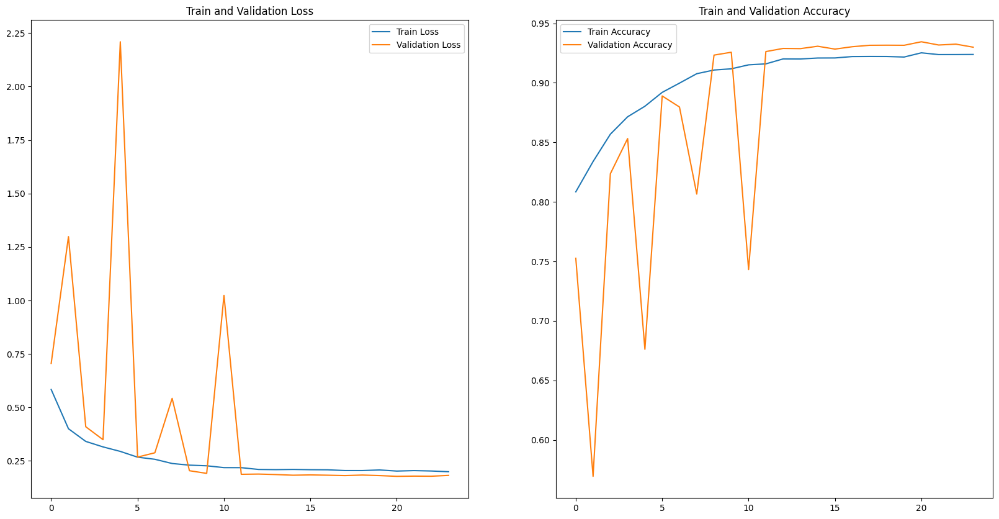

In [210]:
# plot the loss and accuracy

history=model.history.history

# plot the loss and accuracy

fig, axarr = plt.subplots(1,2, figsize=(20,10))
axarr[0].plot(history['loss'], label='Train Loss')
axarr[0].plot(history['val_loss'], label='Validation Loss')
axarr[0].set_title('Train and Validation Loss')
axarr[0].legend()

axarr[1].plot(history['accuracy'], label='Train Accuracy')
axarr[1].plot(history['val_accuracy'], label='Validation Accuracy')
axarr[1].set_title('Train and Validation Accuracy')
axarr[1].legend()

plt.show()

In [211]:
# classifcation report:

# validation seti için tahminler

val_preds=model.predict(val_aug1)
val_preds=np.round(val_preds)


val_true=val_aug1.classes


# validation seti için classification report

print('Validation Seti İçin Classification Report\n')
print(classification_report(val_true, val_preds))


391/391 ━━━━━━━━━━━━━━━━━━━━ 93s 236ms/step
Validation Seti İçin Classification Report

              precision    recall  f1-score   support

           0       0.94      0.93      0.93      6250
           1       0.93      0.94      0.93      6250

    accuracy                           0.93     12500
   macro avg       0.93      0.93      0.93     12500
weighted avg       0.93      0.93      0.93     12500



In [212]:
# confusion matrix

cm=confusion_matrix(val_true, val_preds)

fig=px.imshow(confusion_matrix(val_true,val_preds),color_continuous_scale='tropic',title="Confusion Matrix of "+model.__class__.__name__,
              labels=dict(x="Predicted",y="Actual",color="Counts"),color_continuous_midpoint=0.8,
              width=800,height=600,template="plotly_dark",text_auto=True)
fig.show()



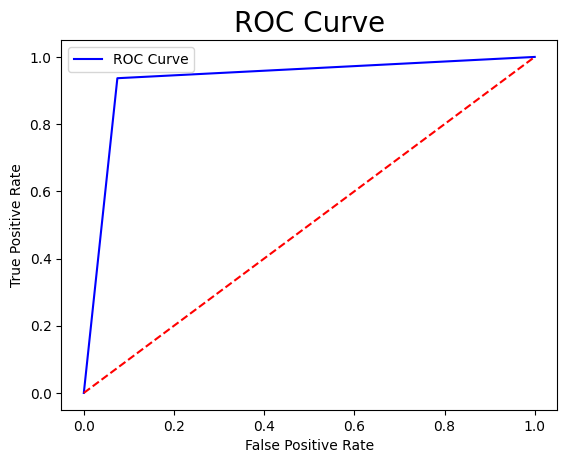

In [213]:
# roc curve


fpr, tpr, thresholds=roc_curve(y_true, val_preds)

plt.plot(fpr, tpr, label='ROC Curve', color='blue')
plt.plot([0,1], [0,1], color='red', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve', fontsize=20)
plt.legend()

In [215]:
# test seti için bir klasör oluşturuyoruz

if os.path.exists('test_set_dir'):
    pass
else:
    # test_set_dir adında bir klasör oluşturuyoruz
    test_dir = 'test_set_dir'
    os.mkdir(test_dir)
    
    # test_dir içinde test_images adında bir klasör oluşturuyoruz
    test_images = os.path.join(test_dir, 'test_images')
    os.mkdir(test_images)


In [216]:
# test resimleri test_images klasörüne taşıyoruz

if os.path.exists('test_set_dir/test_images'):
    pass
else:

    test_list = os.listdir('test/')

    for image in test_list:
        fname = image
        # resimlerin olduğu klasör
        src = os.path.join('test/', fname)
        # test_images klasörüne taşıyoruz
        dst = os.path.join(test_images, fname)
        # resimleri kaynaktan hedefe kopyalıyoruz
        shutil.copyfile(src, dst)

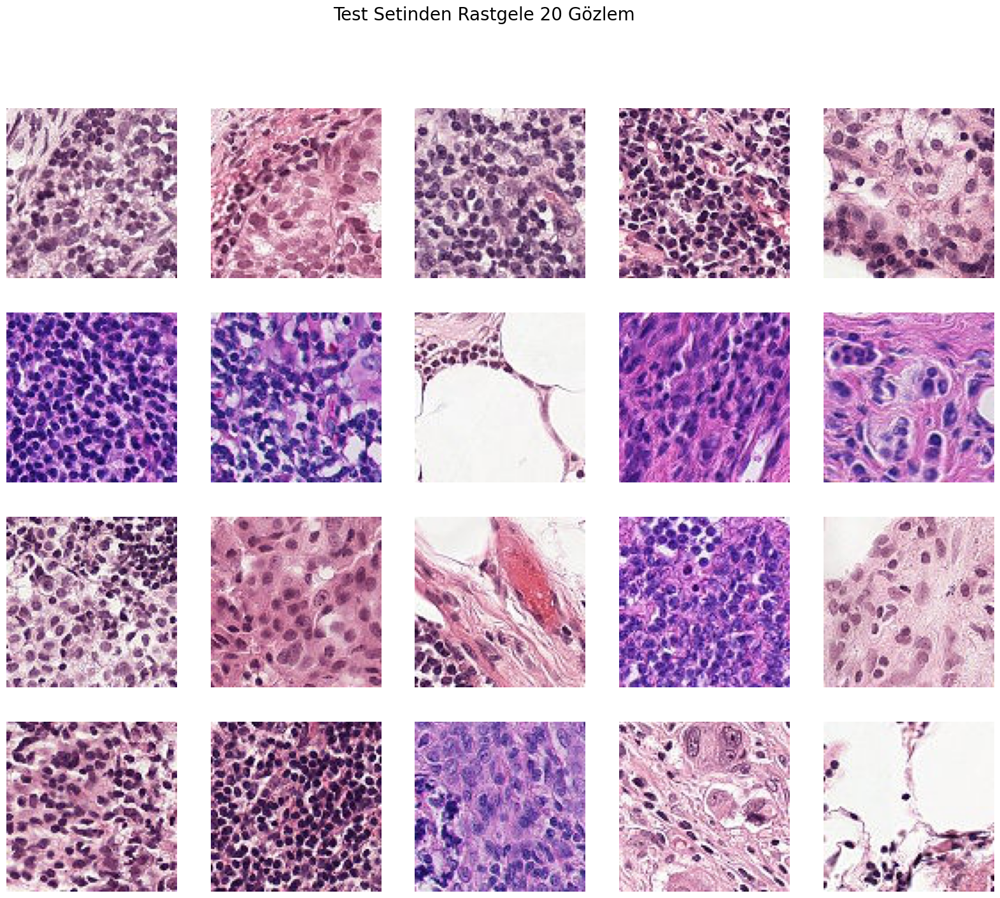

In [217]:
# test veri setinden örnek 20 gözlem

test_path='test_set_dir/test_images/'
test_images=os.listdir(test_path)

fig, axarr = plt.subplots(4,5, figsize=(20,16))
fig.suptitle('Test Setinden Rastgele 20 Gözlem', fontsize=20)
for i in range(4):
    for j in range(5):
        img=Image.open(test_path + test_images[np.random.randint(0,len(test_images))])
        axarr[i,j].imshow(img)
        axarr[i,j].axis('off')
        
plt.show()


Found 57458 images belonging to 1 classes.
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 881ms/step


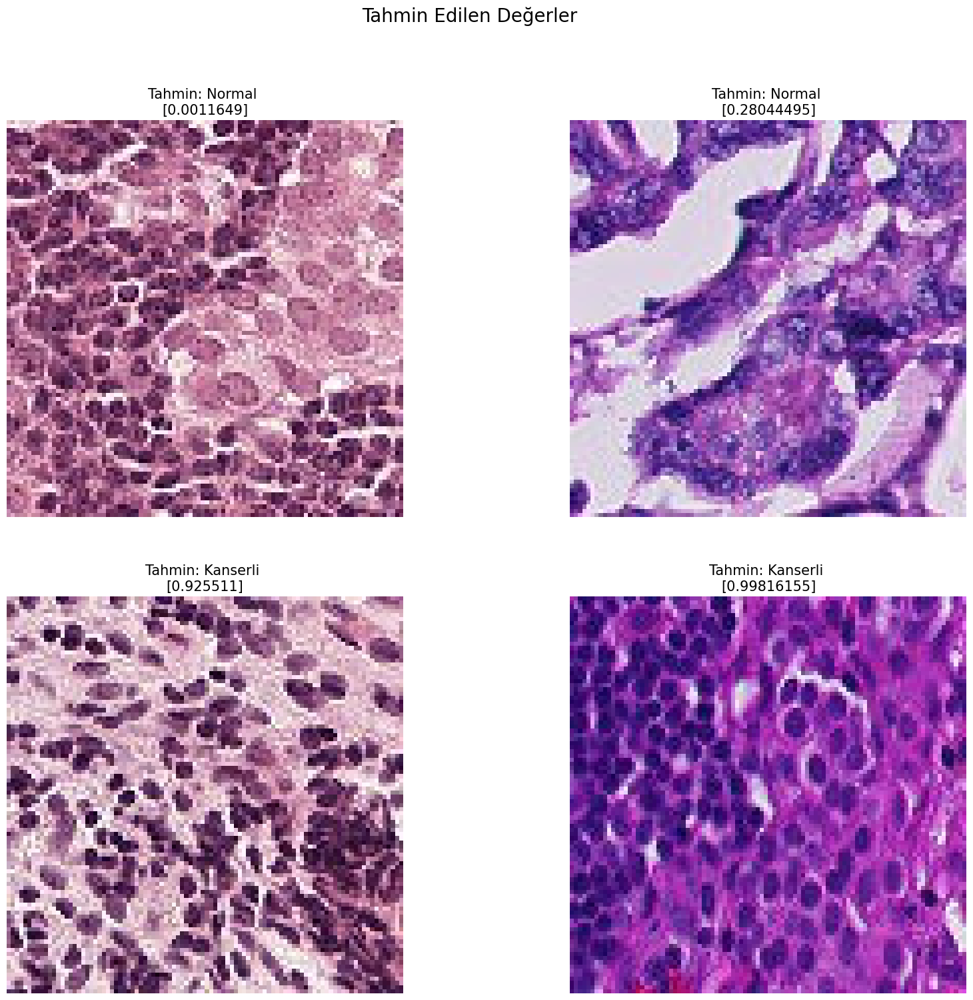

In [18]:
# test veri seti için veri artırma

from keras.models import load_model

test_datagen=ImageDataGenerator(rescale=1./255)

test_aug=test_datagen.flow_from_directory('test_set_dir',
                                        target_size=(96,96),
                                        batch_size=32,
                                        class_mode='binary',
                                        shuffle=False)


# test veri setinden 20 gözlem alıyoruz
test_images, test_labels = next(test_aug)

# tahmin etme

model=load_model('model_history.keras')

predictions=model.predict(test_images)

# tahmin edilen değerlerin görselleştirilmesi

fig, axarr = plt.subplots(2,2, figsize=(20,17))
fig.suptitle('Tahmin Edilen Değerler', fontsize=20)

for i in range(2):
    for j in range(2):
        img=test_images[5*i+j]
        axarr[i,j].imshow(img)
        axarr[i,j].axis('off')
        if predictions[5*i+j] > 0.5:
            axarr[i,j].set_title(f"Tahmin: Kanserli \n{predictions[5*i+j]}", fontsize=15)
        else:
            axarr[i,j].set_title(f"Tahmin: Normal \n{predictions[5*i+j]}", fontsize=15)
        
plt.show()

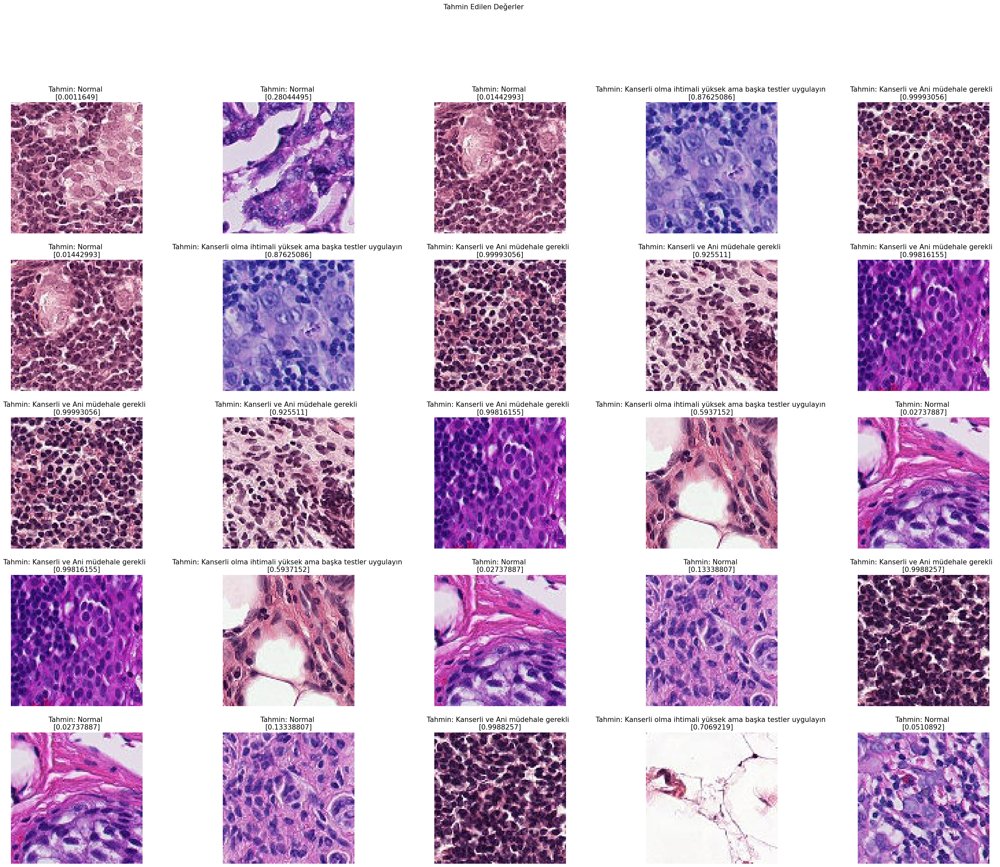

In [25]:
fig, axarr = plt.subplots(5,5, figsize=(40,30), sharex=True, sharey=True)
fig.suptitle('Tahmin Edilen Değerler', fontsize=15)
for i in range(5):
    for j in range(5):
        img=test_images[2*i+j]
        axarr[i,j].imshow(img)
        axarr[i,j].axis('off')
        if predictions[2*i+j] > 0.9:
            axarr[i,j].set_title(f"Tahmin: Kanserli ve Ani müdehale gerekli  \n{predictions[2*i+j]}", fontsize=15)
        
        elif predictions[2*i+j] > 0.5 and predictions[2*i+j] < 0.9:
            axarr[i,j].set_title(f"Tahmin: Kanserli olma ihtimali yüksek ama başka testler uygulayın \n{predictions[2*i+j]}", fontsize=15)
        
        elif predictions[2*i+j] < 0.5 and predictions[2*i+j] > 0.3:
            axarr[i,j].set_title(f"Tahmin: Kanserli olma ihtimali düşük ama başka testler uygulayın \n{predictions[2*i+j]}", fontsize=15)
        else:
            axarr[i,j].set_title(f"Tahmin: Normal \n{predictions[2*i+j]}", fontsize=15)
        
plt.show()